<a href="https://colab.research.google.com/github/bellacitrine/minji/blob/minji/calinski_harabasz_score.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.cluster import KMeans

In [2]:
df = pd.read_csv('/content/units_tiers_and_comb.csv')

In [3]:
df.shape

(9288, 70)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9288 entries, 0 to 9287
Data columns (total 70 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   gameId         9288 non-null   object 
 1   game_datetime  9288 non-null   int64  
 2   game_length    9288 non-null   float64
 3   game_version   9288 non-null   object 
 4   puuid          9288 non-null   object 
 5   placement      9288 non-null   int64  
 6   last_round     9288 non-null   int64  
 7   level          9288 non-null   int64  
 8   시비르            9288 non-null   int64  
 9   리븐             9288 non-null   int64  
 10  쉔              9288 non-null   int64  
 11  탐 켄치           9288 non-null   int64  
 12  갈리오            9288 non-null   int64  
 13  카이사            9288 non-null   int64  
 14  사일러스           9288 non-null   int64  
 15  우디르            9288 non-null   int64  
 16  케일             9288 non-null   int64  
 17  케이틀린           9288 non-null   int64  
 18  렉사이     

In [5]:
df.head(9288)

,gameId,game_datetime,game_length,game_version,puuid,placement,last_round,level,시비르,리븐,...,코부코,다리우스,아펠리오스,쓰레쉬,초가스,말파이트,가렌,티모,자야,Combination
0,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,BWLn3nfAuki-3ju22n-ni5exBESPlXaPsyF9bZ3uFeuvr1...,7,28,8,2,2,...,0,0,0,0,0,0,0,0,0,"TFT11_Sivir, TFT11_Riven, TFT11_Shen, TFT11_Ta..."
1,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,mptEuTzeZ2MWsLxe4KfwLTr2iJp2uUphE7maw8CwGfeeFK...,1,40,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Caitlyn, TFT11_RekSai, TFT11_Jax, TFT11_..."
2,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,iM__viRIlCBc3VBF9p0BK9a58MsQTrB6Svi4asmtcw4vxk...,4,34,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Udyr, TFT11_Ornn, TFT11_Azir, TFT11_Jann..."
3,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,XwRIqTXBnBYgAU3Jct9FIDtrIOy01HBn4PUM6BecUex8D2...,8,27,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_TahmKench, TFT11_Sylas, TFT11_Udyr, TFT1..."
4,KR_7005435650,1711611092537,2339.676514,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,bAUTBjhuA00n1167MUmonjyMgetU3Dv1-5IGNUqWwWt-59...,6,28,8,0,1,...,0,0,0,0,0,0,0,0,0,"TFT11_Riven, TFT11_Galio, TFT11_Udyr, TFT11_Ka..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9283,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,sMD7iMyWZ2ztcGvcYyXf92yYF6ui0ipF8UInDkKm6wMnJc...,4,33,10,0,1,...,0,0,0,0,0,0,0,0,0,"TFT11_Riven, TFT11_Galio, TFT11_Kayle, TFT11_S..."
9284,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,4W5dMgFaI2qWXtzftLCjec16RypS_e_0BaHIynnzUApIEj...,3,34,9,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Udyr, TFT11_Ornn, TFT11_Azir, TFT11_Jann..."
9285,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,m-WJmbLS17zaoDDdN1NjqRMGuXkZChReSv8-36lQ32zgt2...,1,37,8,0,0,...,0,0,3,3,0,0,0,0,0,"TFT11_Lissandra, TFT11_Illaoi, TFT11_Ashe, TFT..."
9286,KR_7005139736,1711571877752,2173.421143,Version 14.6.570.6276 (Mar 25 2024/14:00:15) [...,eJBg1EVkQRS4fXbZKDAkyuQuYzL-kF1Ps7NOxHuwiAQ29V...,6,28,8,0,0,...,0,0,0,0,0,0,0,0,0,"TFT11_Shen, TFT11_Caitlyn, TFT11_Jax, TFT11_Aa..."


In [6]:
df['gameId'] = df['gameId'].str.slice(start = 3)

In [7]:
df = df.drop(['gameId', 'game_datetime', 'game_length', 'game_version', 'puuid',
       'placement', 'last_round','Combination', 'level'], axis=1)
df

,시비르,리븐,쉔,탐 켄치,갈리오,카이사,사일러스,우디르,케일,케이틀린,...,신드라,코부코,다리우스,아펠리오스,쓰레쉬,초가스,말파이트,가렌,티모,자야
0,2,2,1,2,1,2,2,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1,0,0,2,2,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,2,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9283,0,1,0,0,2,0,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
9284,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
9285,0,0,0,0,0,0,0,0,0,0,...,2,0,0,3,3,0,0,0,0,0
9286,0,0,3,0,0,0,0,0,0,3,...,0,0,0,0,0,0,0,0,0,0


In [8]:
from sklearn.cluster import KMeans
from sklearn.metrics import calinski_harabasz_score

for k in range(2, 10):
    kmeans_model = KMeans(n_clusters=k, random_state=1).fit(df)
    labels = kmeans_model.labels_
    print(calinski_harabasz_score(df, labels))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1105.839614323157


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


995.9267982365313


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1020.8048354642038


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1046.5324981228027


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1033.152646149754


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1015.9875483877831


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1029.7072785415446


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


1007.3961936268952


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

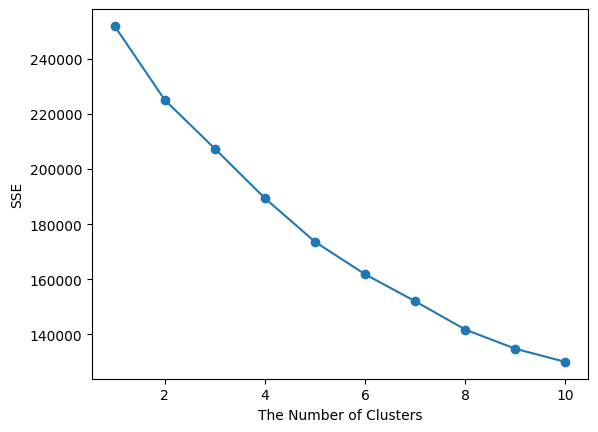

[251905.01238156806, 225098.73437144945, 207410.5312449981, 189422.34541667142, 173614.36708075448, 161837.04087876563, 152041.47615805035, 141781.02069927653, 134813.92042456637, 130046.83726057052]


In [9]:
import matplotlib.pyplot as plt
def elbow(df):
    sse=[]
    for i in range(1, 11):
        km=KMeans(n_clusters=i, random_state=1)
        km.fit(df)
        sse.append(km.inertia_)

    plt.plot(range(1,11), sse, marker='o')
    plt.xlabel('The Number of Clusters')
    plt.ylabel('SSE')
    plt.show()
    print(sse)

elbow(df)

In [10]:
km = KMeans(n_clusters=3, random_state=1)
km.fit(df)
new_labels = km.labels_
df['cluster'] = new_labels

df.groupby(['cluster']).mean()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,시비르,리븐,쉔,탐 켄치,갈리오,카이사,사일러스,우디르,케일,케이틀린,...,신드라,코부코,다리우스,아펠리오스,쓰레쉬,초가스,말파이트,가렌,티모,자야
cluster,,,,,,,,,,,,,,,,,,,,,
0,0.015774,0.089885,0.094642,0.221833,0.120931,0.054832,0.443665,0.602904,0.020280,0.197296,...,0.032298,0.019780,0.245368,0.009264,0.052829,0.280170,0.359790,0.010265,0.015273,0.018277
1,0.007643,0.032985,0.909493,0.011263,0.035800,0.097345,0.128721,0.273130,0.004425,0.831858,...,0.787208,0.008045,0.171360,0.936444,0.985921,0.008850,0.016492,0.015688,0.018101,0.014883
2,0.884972,1.788105,0.016738,0.731125,1.284900,0.328704,0.324430,0.177350,1.279915,0.003205,...,0.007123,0.071937,0.001068,0.001068,0.009615,0.006766,0.011752,0.285256,0.280271,0.096154


In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df,
             diag_kind='kde',
             hue="cluster",
             corner=True,
             palette='bright')
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50508 (\N{HANGUL SYLLABLE AL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47340 (\N{HANGUL SYLLABLE RUN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47085 (\N{HANGUL SYLLABLE REOG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47924 (\N{HANGUL SYLLABLE MU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48512 (\N{HANGUL SYLLABLE BU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IP

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df,
             diag_kind='kde',
             hue="cluster",
             corner =True,
             palette='bright')
plt.show()

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49772 (\N{HANGUL SYLLABLE SWI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45432 (\N{HANGUL SYLLABLE NO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54008 (\N{HANGUL SYLLABLE TIL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47533 (\N{HANGUL SYLLABLE RIG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50508 (\N{HANGUL SYLLABLE AL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IP